<a href="https://colab.research.google.com/github/devika-kla/DCGAN/blob/main/dcgan_with_keras.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Convolutional Generative Adversarial Network


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import imageio
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout
from keras.preprocessing.image import array_to_img, img_to_array, load_img #keras.utils
from numpy.random import randn
from numpy.random import randint
import tensorflow as tf

# PARAMETERS

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
batch_size = 64
latent_dim = 100
n_epoch = 100
img_shape = (128, 128, 3)

In [ ]:
data_dir = '/content/drive/MyDrive/MSC/SEM3/GAN/img_align_celeba'
images = os.listdir(data_dir)

# PLOT IMAGES

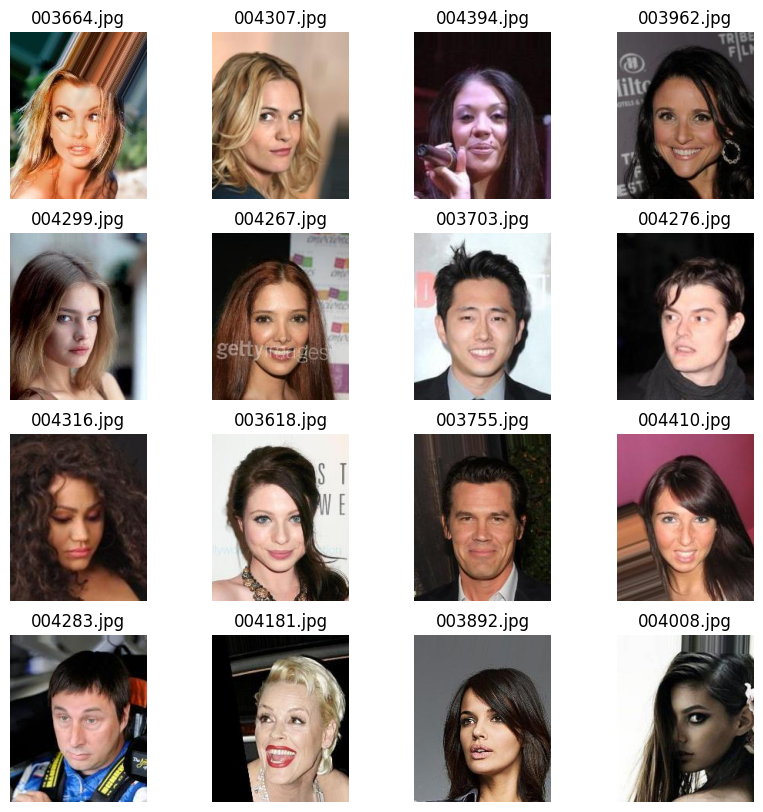

In [ ]:
plt.figure(figsize=(10,10))
for i, name in enumerate(images[:16]):
    plt.subplot(4, 4, i + 1)
    img = plt.imread(data_dir + '/' + name)
    plt.imshow(img)
    plt.title(name)
    plt.axis('off')

# GET DATA

In [ ]:
def get_data(data_path) :
    X = []
    for filename in data_path :
        img = img_to_array(load_img(data_dir + "/" + filename, target_size = img_shape[:2]))
        X.append(img)
    X = np.array(X).astype('float32')
    #X = (X - 127.5) / 127.5
    X = X / 255
    return X

dataset = get_data(images)

In [ ]:
dataset.shape

(5000, 128, 128, 3)

# DISCRIMINATOR

In [ ]:
def define_discriminator(in_shape=(128,128,3)):
    model = Sequential()
    # normal
    model.add(Conv2D(128, (5,5), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 64x64
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 32x32
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 16x16
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 8x8
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # classifier
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    opt = Adam(learning_rate=0.0002)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

# GENERATOR

In [ ]:
def define_generator(latent_dim):
    model = Sequential()
    # foundation for 8x8 feature maps
    n_nodes = 128 * 8 * 8
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((8, 8, 128)))
    # upsample to 16x16
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 32x32
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 64x64
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 128x128
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # output layer 128x128x3
    model.add(Conv2D(3, (5,5), activation='tanh', padding='same'))
    return model

#input of Generator
def generate_latent_points(latent_dim, n_samples):
    x_input = randn(latent_dim * n_samples)
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input

# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
    x_input = generate_latent_points(latent_dim, n_samples)
    X = g_model.predict(x_input)
    y = np.zeros((n_samples, 1)) #class labels(0)
    return X, y

# GAN

In [ ]:
def define_gan(g_model, d_model):
    d_model.trainable = False
    model = Sequential()
    model.add(g_model)
    model.add(d_model)
    # compile model
    opt = Adam(learning_rate=0.0002)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

# retrive real samples
def get_real_samples(dataset, n_samples):
    ix = randint(0, dataset.shape[0], n_samples)
    X = dataset[ix]
    y = np.ones((n_samples, 1)) #class label(1)
    return X, y

# create and save a plot of generated images
def show_generated(generated,epoch, n=5):
    #generated = generated*255
    plt.figure(figsize=(10,10))
    for i in range(n * n):
        plt.subplot(n, n, i + 1)
        plt.imshow(generated[i])
        plt.axis('off')
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch+1))
    plt.show()

# evaluate the discriminator and plot generated images
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=100):
    X_real, y_real = get_real_samples(dataset, n_samples)
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    print('>Accuracy [real: %.0f%%, fake: %.0f%%]' % (acc_real*100, acc_fake*100))
    show_generated(x_fake, epoch)

# TRAIN

In [ ]:
d_losses = []
g_losses = []

In [ ]:
def train(g_model, d_model, gan_model, dataset, latent_dim=100, n_epochs=100, n_batch=128):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    start = time.time()
    for i in range(n_epochs):
        for j in range(bat_per_epo):
            X_real, y_real = get_real_samples(dataset, half_batch)
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)

            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)

            X_gan = generate_latent_points(latent_dim, n_batch)
            y_gan = np.ones((n_batch, 1))
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
        d_losses.append(d_loss1+d_loss2)
        g_losses.append(g_loss)

        # summarize loss on this batch
        print('Epoch: %d,  Loss: D_real = %.3f, D_fake = %.3f,  G = %.3f' %   (i+1, d_loss1, d_loss2, g_loss))
        # evaluate the model performance
        if (i+1) % 5 == 0:
            summarize_performance(i, g_model, d_model, dataset, latent_dim)
    print ('Total time for training {} epochs is {} sec'.format(n_epochs, (time.time()-start)))
    g_model.save("dcgan.h5")

1/1 [==============================] - 0s 16ms/step
Epoch: 1,  Loss: D_real = 0.000, D_fake = 0.213,  G = 5.385
1/1 [==============================] - 0s 16ms/step
Epoch: 2,  Loss: D_real = 0.000, D_fake = 0.330,  G = 2.446
1/1 [==============================] - 0s 27ms/step
Epoch: 3,  Loss: D_real = 0.209, D_fake = 0.074,  G = 4.477
1/1 [==============================] - 0s 16ms/step
Epoch: 4,  Loss: D_real = 1.598, D_fake = 0.787,  G = 2.128
1/1 [==============================] - 0s 19ms/step
Epoch: 5,  Loss: D_real = 0.107, D_fake = 0.077,  G = 4.849
4/4 [==============================] - 0s 49ms/step


>Accuracy [real: 86%, fake: 99%]


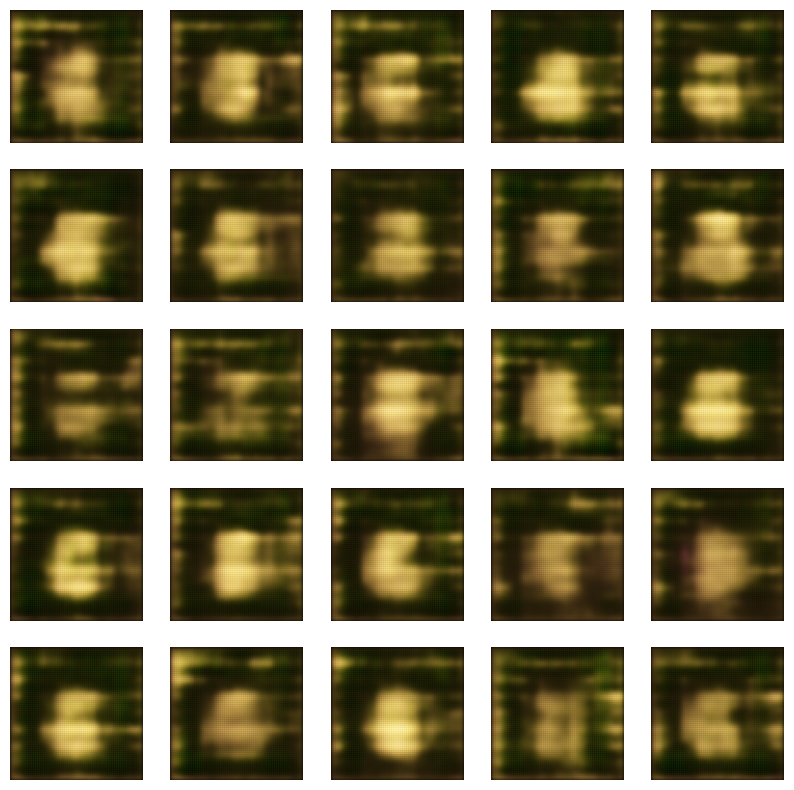

1/1 [==============================] - 0s 17ms/step
Epoch: 6,  Loss: D_real = 0.075, D_fake = 0.038,  G = 6.968
1/1 [==============================] - 0s 29ms/step
Epoch: 7,  Loss: D_real = 0.201, D_fake = 0.533,  G = 2.478
1/1 [==============================] - 0s 18ms/step
Epoch: 8,  Loss: D_real = 0.053, D_fake = 0.083,  G = 2.842
1/1 [==============================] - 0s 17ms/step
Epoch: 9,  Loss: D_real = 0.010, D_fake = 0.500,  G = 3.083
1/1 [==============================] - 0s 26ms/step
Epoch: 10,  Loss: D_real = 0.485, D_fake = 0.636,  G = 2.528
4/4 [==============================] - 0s 49ms/step


>Accuracy [real: 85%, fake: 75%]


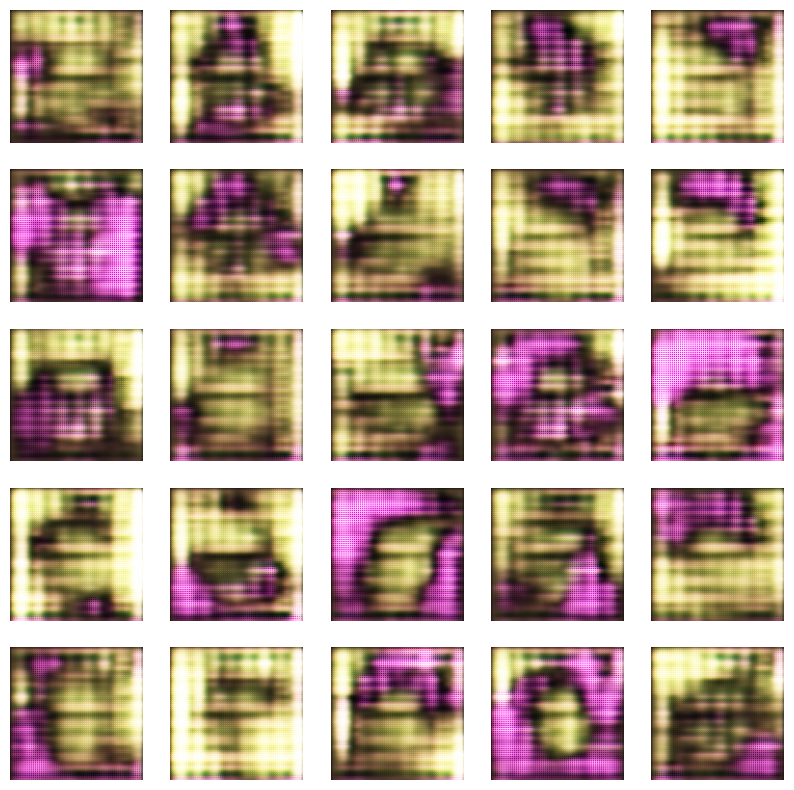

1/1 [==============================] - 0s 27ms/step
Epoch: 11,  Loss: D_real = 0.185, D_fake = 0.739,  G = 0.907
1/1 [==============================] - 0s 16ms/step
Epoch: 12,  Loss: D_real = 0.309, D_fake = 0.059,  G = 3.693
1/1 [==============================] - 0s 17ms/step
Epoch: 13,  Loss: D_real = 0.269, D_fake = 0.237,  G = 3.077
1/1 [==============================] - 0s 25ms/step
Epoch: 14,  Loss: D_real = 0.113, D_fake = 0.076,  G = 4.293
1/1 [==============================] - 0s 25ms/step
Epoch: 15,  Loss: D_real = 0.387, D_fake = 0.096,  G = 4.222
4/4 [==============================] - 0s 50ms/step


>Accuracy [real: 90%, fake: 96%]


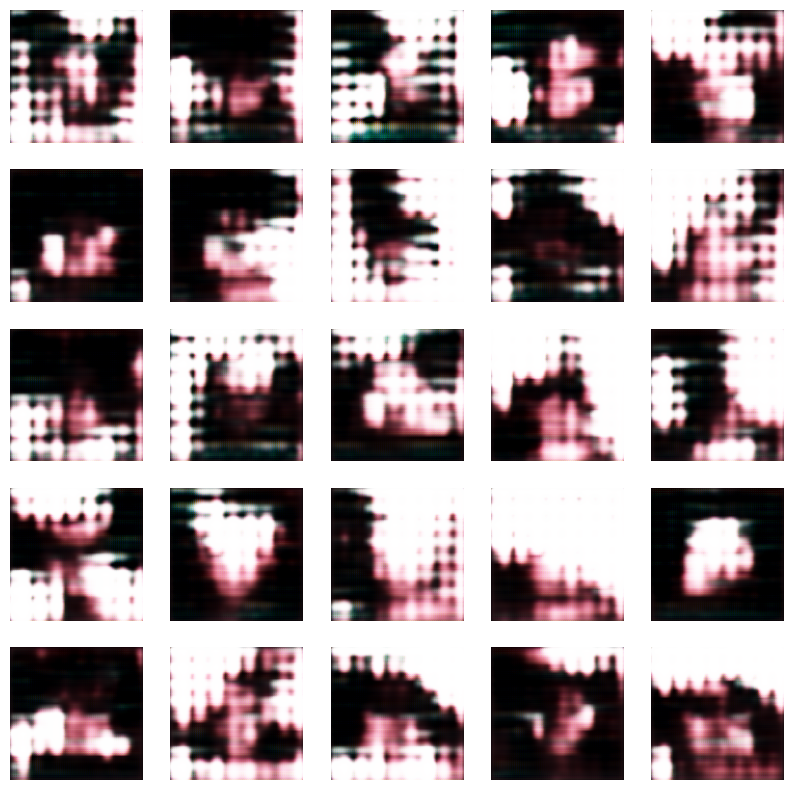

1/1 [==============================] - 0s 17ms/step
Epoch: 16,  Loss: D_real = 0.271, D_fake = 0.139,  G = 2.702
1/1 [==============================] - 0s 16ms/step
Epoch: 17,  Loss: D_real = 0.013, D_fake = 0.085,  G = 8.169
1/1 [==============================] - 0s 30ms/step
Epoch: 18,  Loss: D_real = 0.728, D_fake = 0.763,  G = 2.384
1/1 [==============================] - 0s 18ms/step
Epoch: 19,  Loss: D_real = 0.788, D_fake = 2.191,  G = 3.111
1/1 [==============================] - 0s 16ms/step
Epoch: 20,  Loss: D_real = 0.147, D_fake = 0.105,  G = 4.121
4/4 [==============================] - 0s 50ms/step


>Accuracy [real: 89%, fake: 98%]


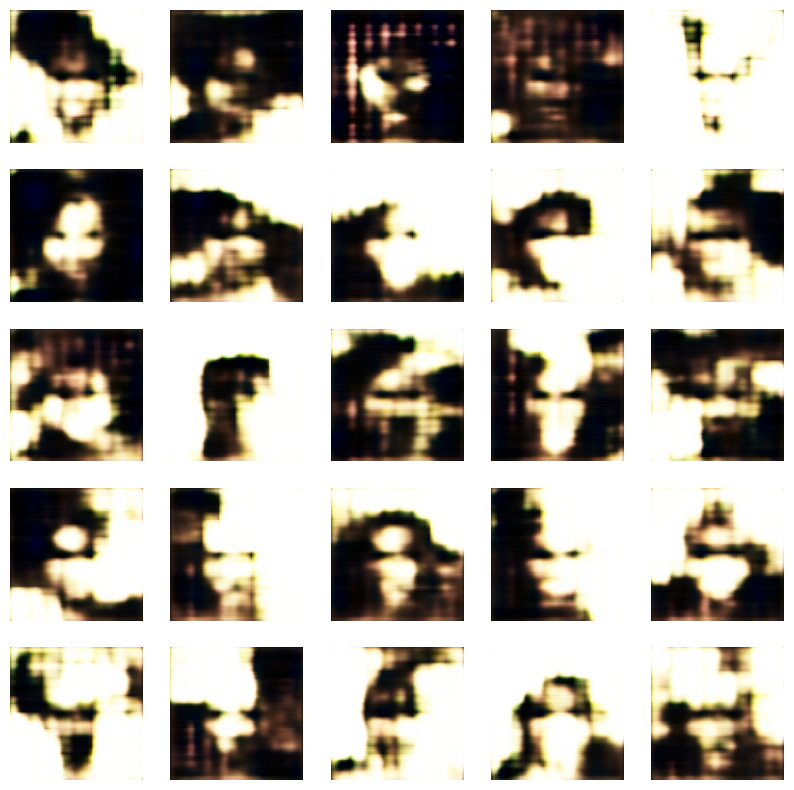

1/1 [==============================] - 0s 16ms/step
Epoch: 21,  Loss: D_real = 0.243, D_fake = 0.158,  G = 3.150
1/1 [==============================] - 0s 26ms/step
Epoch: 22,  Loss: D_real = 0.175, D_fake = 0.046,  G = 5.609
1/1 [==============================] - 0s 19ms/step
Epoch: 23,  Loss: D_real = 0.068, D_fake = 1.069,  G = 5.570
1/1 [==============================] - 0s 17ms/step
Epoch: 24,  Loss: D_real = 0.502, D_fake = 0.648,  G = 3.075
1/1 [==============================] - 0s 17ms/step
Epoch: 25,  Loss: D_real = 0.005, D_fake = 0.092,  G = 6.531
4/4 [==============================] - 0s 50ms/step


>Accuracy [real: 98%, fake: 99%]


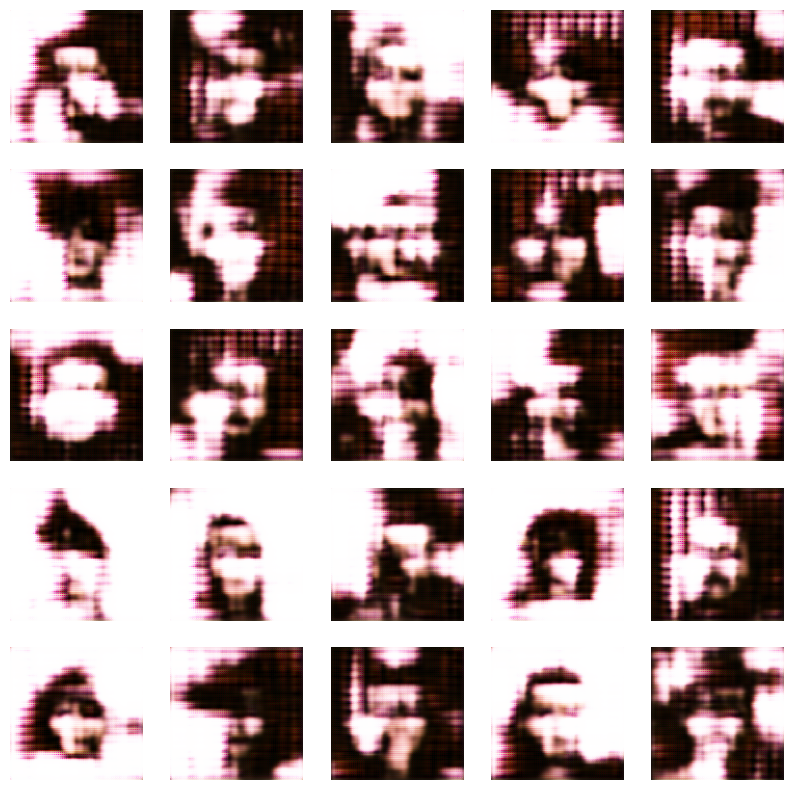

1/1 [==============================] - 0s 32ms/step
Epoch: 26,  Loss: D_real = 0.289, D_fake = 0.093,  G = 4.013
1/1 [==============================] - 0s 17ms/step
Epoch: 27,  Loss: D_real = 0.229, D_fake = 0.099,  G = 3.019
1/1 [==============================] - 0s 16ms/step
Epoch: 28,  Loss: D_real = 0.371, D_fake = 0.095,  G = 4.715
1/1 [==============================] - 0s 16ms/step
Epoch: 29,  Loss: D_real = 0.021, D_fake = 0.017,  G = 6.689
1/1 [==============================] - 0s 19ms/step
Epoch: 30,  Loss: D_real = 0.340, D_fake = 0.007,  G = 7.106
4/4 [==============================] - 0s 49ms/step


>Accuracy [real: 56%, fake: 96%]


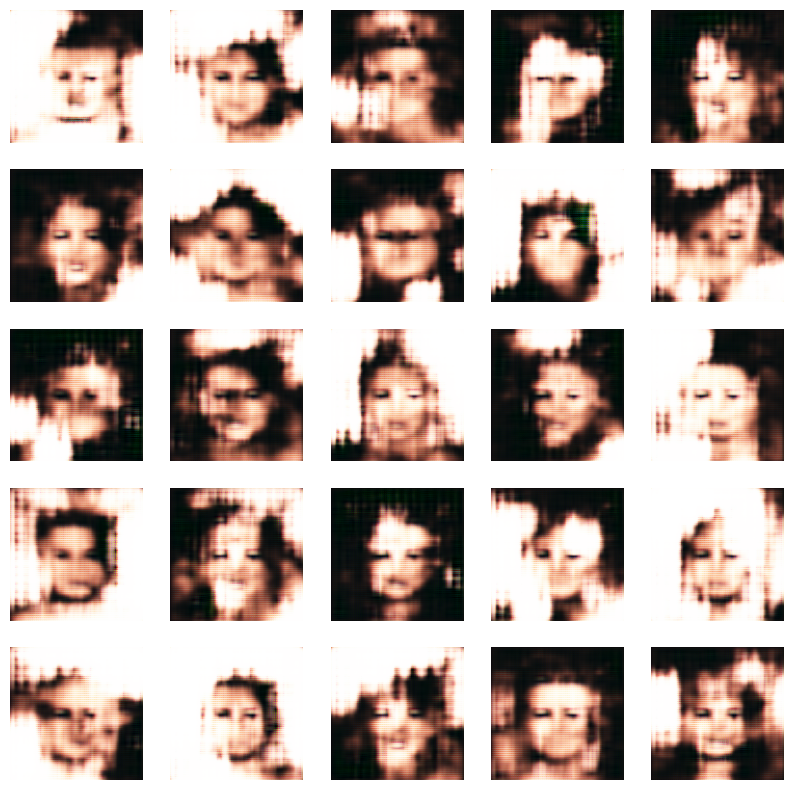

1/1 [==============================] - 0s 17ms/step
Epoch: 31,  Loss: D_real = 0.229, D_fake = 0.289,  G = 4.347
1/1 [==============================] - 0s 24ms/step
Epoch: 32,  Loss: D_real = 0.849, D_fake = 0.470,  G = 3.065
1/1 [==============================] - 0s 19ms/step
Epoch: 33,  Loss: D_real = 0.101, D_fake = 0.026,  G = 5.794
1/1 [==============================] - 0s 16ms/step
Epoch: 34,  Loss: D_real = 0.291, D_fake = 0.281,  G = 3.728
1/1 [==============================] - 0s 28ms/step
Epoch: 35,  Loss: D_real = 1.783, D_fake = 0.094,  G = 10.373
4/4 [==============================] - 0s 50ms/step


>Accuracy [real: 52%, fake: 100%]


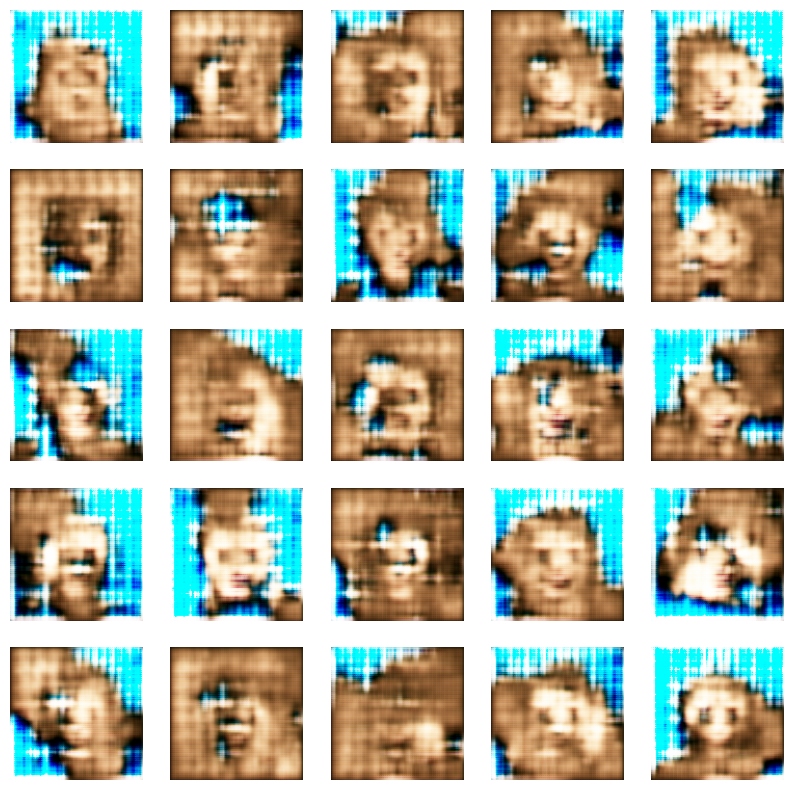

1/1 [==============================] - 0s 16ms/step
Epoch: 36,  Loss: D_real = 0.521, D_fake = 0.185,  G = 3.269
1/1 [==============================] - 0s 16ms/step
Epoch: 37,  Loss: D_real = 0.079, D_fake = 0.033,  G = 5.371
1/1 [==============================] - 0s 16ms/step
Epoch: 38,  Loss: D_real = 0.242, D_fake = 0.052,  G = 4.068
1/1 [==============================] - 0s 26ms/step
Epoch: 39,  Loss: D_real = 0.012, D_fake = 0.133,  G = 3.371
1/1 [==============================] - 0s 20ms/step
Epoch: 40,  Loss: D_real = 0.045, D_fake = 0.783,  G = 2.683
4/4 [==============================] - 0s 50ms/step


>Accuracy [real: 99%, fake: 83%]


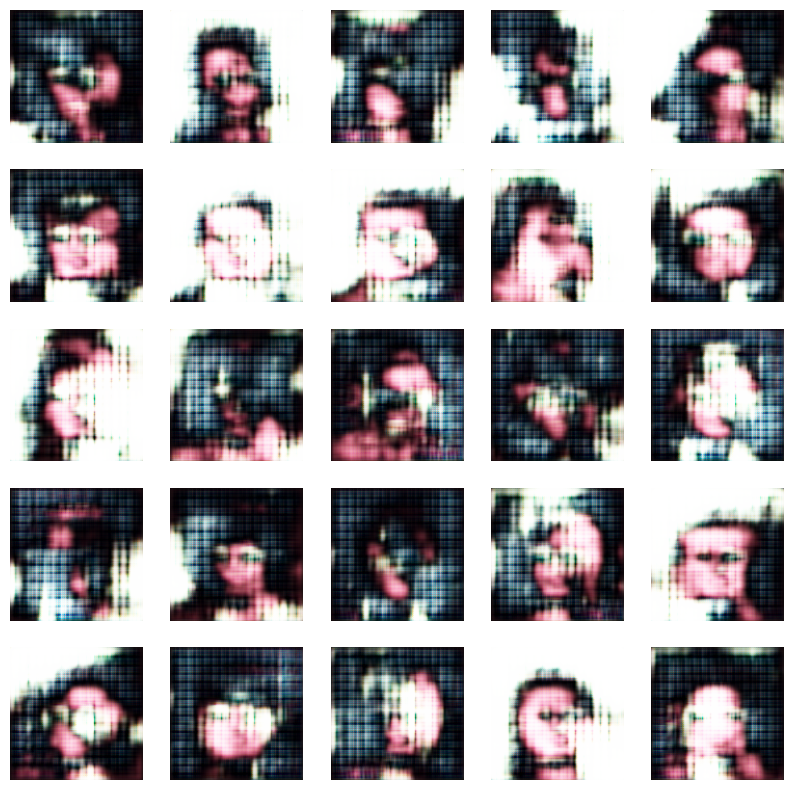

1/1 [==============================] - 0s 16ms/step
Epoch: 41,  Loss: D_real = 0.115, D_fake = 0.007,  G = 10.891
1/1 [==============================] - 0s 16ms/step
Epoch: 42,  Loss: D_real = 0.184, D_fake = 0.085,  G = 3.815
1/1 [==============================] - 0s 30ms/step
Epoch: 43,  Loss: D_real = 0.200, D_fake = 0.123,  G = 4.009
1/1 [==============================] - 0s 16ms/step
Epoch: 44,  Loss: D_real = 0.183, D_fake = 0.005,  G = 6.331
1/1 [==============================] - 0s 16ms/step
Epoch: 45,  Loss: D_real = 0.073, D_fake = 0.027,  G = 7.723
4/4 [==============================] - 0s 50ms/step


>Accuracy [real: 88%, fake: 98%]


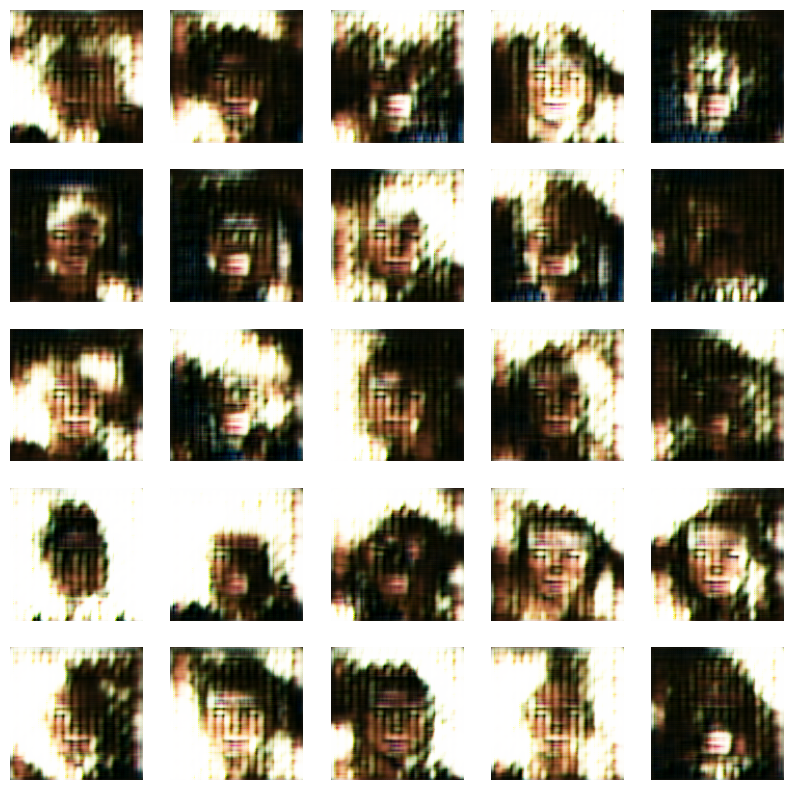

1/1 [==============================] - 0s 29ms/step
Epoch: 46,  Loss: D_real = 0.154, D_fake = 0.248,  G = 3.372
1/1 [==============================] - 0s 16ms/step
Epoch: 47,  Loss: D_real = 0.264, D_fake = 0.357,  G = 2.412
1/1 [==============================] - 0s 16ms/step
Epoch: 48,  Loss: D_real = 0.007, D_fake = 0.063,  G = 3.376
1/1 [==============================] - 0s 28ms/step
Epoch: 49,  Loss: D_real = 0.542, D_fake = 0.188,  G = 3.528
1/1 [==============================] - 0s 19ms/step
Epoch: 50,  Loss: D_real = 0.274, D_fake = 0.217,  G = 3.645
4/4 [==============================] - 0s 50ms/step


>Accuracy [real: 85%, fake: 96%]


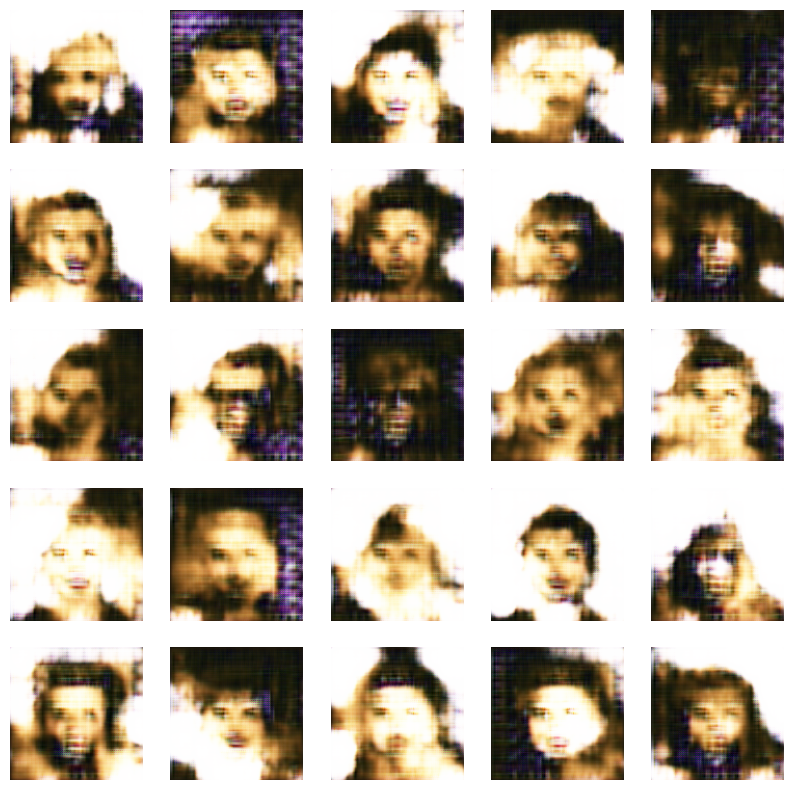

1/1 [==============================] - 0s 16ms/step
Epoch: 51,  Loss: D_real = 0.320, D_fake = 0.126,  G = 3.280
1/1 [==============================] - 0s 34ms/step
Epoch: 52,  Loss: D_real = 0.142, D_fake = 0.091,  G = 4.627
1/1 [==============================] - 0s 16ms/step


In [ ]:
discriminator = define_discriminator()
generator = define_generator(latent_dim)

# create the gan
gan = define_gan(generator, discriminator)

# train model
train(generator, discriminator, gan, dataset, latent_dim, n_epoch, batch_size)

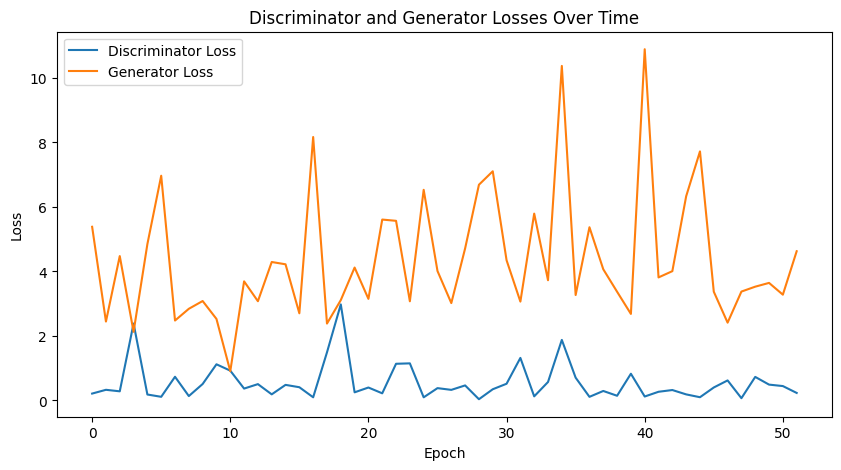

In [ ]:
def plot_losses(d_losses, g_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(d_losses, label="Discriminator Loss")
    plt.plot(g_losses, label="Generator Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Discriminator and Generator Losses Over Time")
    plt.show()
plot_losses(d_losses,g_losses)